<a href="https://colab.research.google.com/github/abhinav-gera12/Dog-Vision-Project-using-ML-and-TensorFlow/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# The Multi-Class Dog Breed Classification Project Model



This notebook builds an image classifier using TensorFlow and TensorFlow Hub.

So let's following the steps to perform it:
#### 1. Problem
Identifying the breed of the dog given an image of a dog.

#### 2. Data
The data we're using it from the Kaggle's dog breed identification competition.
> "https://www.kaggle.com/c/dog-breed-identification/data"

#### 3. Evaluation
The evaluation is a file with the prediction probabilities for each dog breed of each test image

#### 4. Features
Some information about the data:
* We're dealing with the images that is unstructured data. So it's probably best to use the deep learning or transfer learning to collect the information and perform the evaluation on the model.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have the labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

**************************************************************************************************

# GETTING OUR NOTEBOOK STARTS

In [2]:
# IMPORTING THE TENSORFLOW INTO THE GOOGLE COLAB
import tensorflow as tf
print(f"TensorFlow Version: {tf.__version__}")

TensorFlow Version: 2.15.0


In [3]:
# IMPORTING THE TENSORFLOW HUB
import tensorflow_hub as hub
print(f"Tensorflow Hub Version: {hub.__version__}")

Tensorflow Hub Version: 0.16.1


In [4]:
# CHECK FOR GPU AVAILABILITY
if tf.config.list_physical_devices():
  print("GPU is performing on this device")
else:
  print("Not available")

GPU is performing on this device


*****************************************************************************************************************************************

## GETTING OUR DATA READY (TURNING INTO THE TENSORS)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing that. Turning the images into the Tensors (numerical represenation).

Let's start by accessing our data and checking out the data labels.

In [5]:
# IMPORTING THE LABELS DATASET INTO THE GOOGLE COLAB NOTEBOOK
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [6]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [7]:
# HOW MANY IMAGES ARE THERE OF EACH BREED?
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

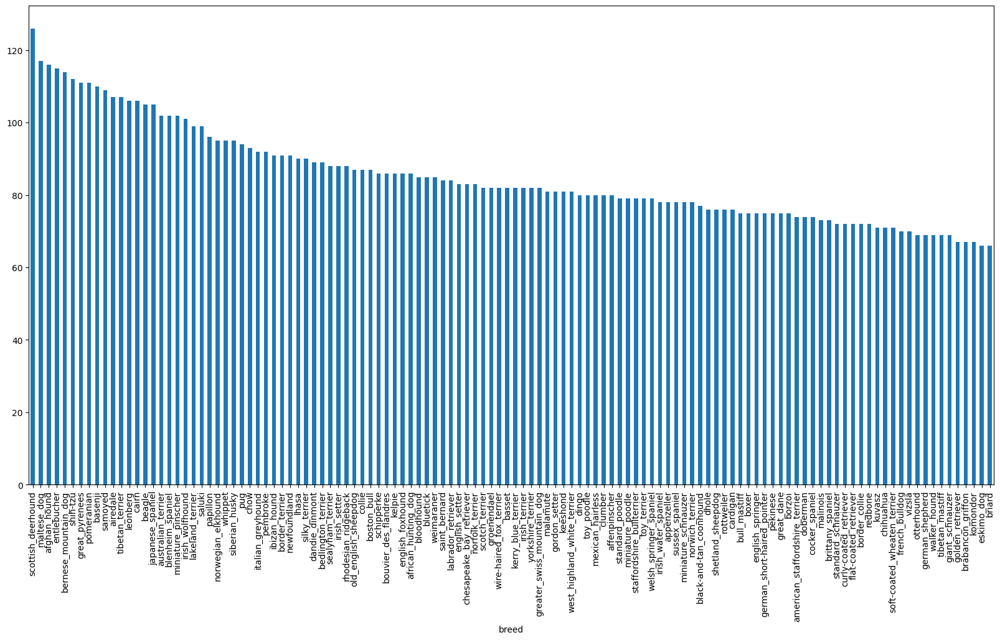

In [8]:
# LET'S VISUALIZE THE EACH BREED WITH THE TOTAL COUNTS
labels_csv["breed"].value_counts().plot(kind = "bar", figsize = (20,10));

In [9]:
# CALCULATING THE MEAN
labels_csv["breed"].value_counts().mean(numeric_only = True)

85.18333333333334

In [10]:
# CALCULATING THE MEDIAN
labels_csv["breed"].value_counts().median(numeric_only = True)

82.0

For each label a user must have at least 10 images, each with at least one annotation. However, for model training purposes it's recommended that using about 100 annotations per label. In general, the more images per label you have the better model will perform

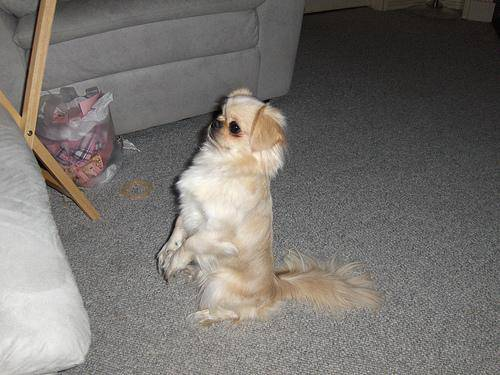

In [11]:
# LET'S IMPORT THE IMAGE INTO THE GOOGLE COLAB NOTEBOOK
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### GETTING IMAGES AND THEIR LABELS
Let's get a list of all of our image file path names from the directory.

In [12]:
# CHECKING THE NAMES OF THE COLUMNS FROM THE DATASET
labels_csv.columns

Index(['id', 'breed'], dtype='object')

In [13]:
# CREATE THE PATH NAMES FROM THE IMAGE ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#CHECK THE FIRST 10 IMAGES NAMES
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [14]:
# CHECK WHETHER NUMBER OF FILENAMES MATCHES NUMBER OF ACTUAL IMAGES FILES

print(f"The filenames variable has total length: = {len(filenames)}")
print(f"The total images in the directory has total length: = {len(labels_csv.breed)}")
print("\n")

if len(filenames) == len(labels_csv["breed"]):
  print("File names match actual amount of files. Proceed!")
else:
  print("File names do not match with the actual amount of files, check the target directory!")

The filenames variable has total length: = 10222
The total images in the directory has total length: = 10222


File names match actual amount of files. Proceed!


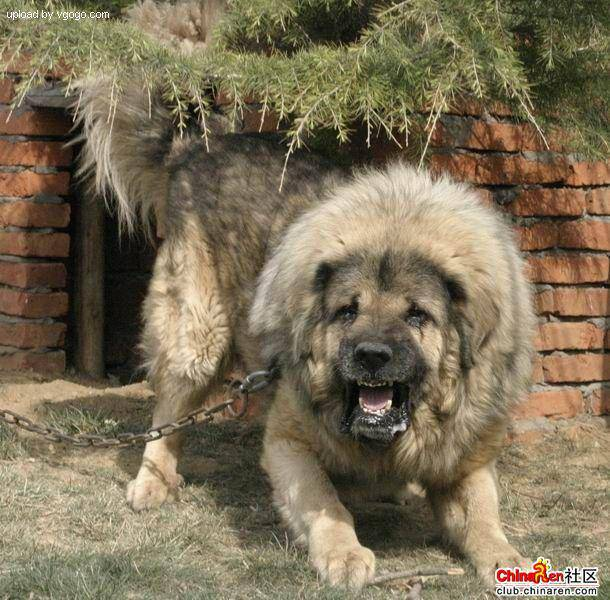

In [15]:
# CHECK AN IMAGE DIRECTLY FROM THE FILE-PATH
Image(filenames[9000])

Since we've now got our training image file paths in a list, let's prepare out the labels.

In [16]:
labels = labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [17]:
# TURNING THE LABELS TO DROP ALL THE REPEATED VALUES
import numpy as np
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [18]:
len(labels)

10222

In [19]:
# SEE IF THE NUMBER OF LABELS MATCHES WITH THE NUMBER OF FILENAMES
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames!")
else:
  print("Number of labels does not match with the number of filenames, check the data directory! ")

Number of labels matches the number of filenames!


In [20]:
# FIND THE UNIQUE LABEL VALUES FORM THE DATA
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [21]:
len(unique_breeds)

120

In [22]:
# TURN A SINGLE LABEL INTO AN ARRAY OF BOOLEANS
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [23]:
# TURN EVERY LABEL INTO A BOOLEAN ARRAY
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [24]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [25]:
# EXAMPLE TURNING THE BOOLEAN INTO THE INTEGER VALUES
print(labels[0])                              #original labels breed
print(np.where(unique_breeds == labels[0]))   #index where the label occurs
print(boolean_labels[0].argmax())             #index where the label occurs in boolean array
print(boolean_labels[0].astype(int))          #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [26]:
# EXAMPLE TURNING THE BOOLEAN INTO THE INTEGER VALUES
print(labels[1])                              #original labels breed
print(np.where(unique_breeds == labels[1]))   #index where the label occurs
print(boolean_labels[1].argmax())             #index where the label occurs in boolean array
print(boolean_labels[1].astype(int))          #there will be a 1 where the sample label occurs

dingo
(array([37]),)
37
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### CREATING OUR OWN VALIDATION SET
since the dataset doesn't come from kaggle with a validation, we're going to create it our own.

In [27]:
# SETUP THE X AND y VARIABLES
X = filenames
Y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [28]:
# SET THE NUMBER OF IMAGES TO USE FOR EXPERIMENTING
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

# **MACHINE LEARNING MODELLING**

In [29]:
# LET'S START WITH SPLITTING THE DATA INTO THE TRAIN AND VALIDATION SETS
from sklearn.model_selection import  train_test_split

# SPLIT THEM INTO THE TRAINING AND VALIDATION FOR TOTAL SIZE NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES],
                                                  Y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(X_val), len(Y_train), len(Y_val)

(800, 200, 800, 200)

In [30]:
# LET'S HAVE A LOOK AT THE TRAINING DATA
X_train[:5], Y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### PREPROCESSING IMAGES
Turning images into the Tensors.

To preprocess, we're going to write a function which does a few things together:
* 1. Take an image file-path as input
* 2. Use TensorFlow to read the file and save it to a variable `image`
* 3. Turn out the `image` (.jpg) into the Tensors
* 4. Normalize our image (convert color channel (0-255) to binary (0-1)
* 5. Resize the `image` to use it as a standard manner. As every image has same size so, it is much easier to access it and apply the algorithm. The shape of the image (224, 224)
* 6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [31]:
# CONVERT IMAGE TO NUMPY ARRAY
# EVERY IMAGE CONSITS OF RED, GREEN, BLUE COLORS ONLY KNOWN AS RGB
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
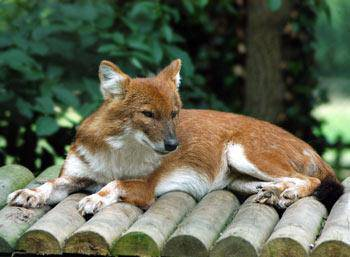

In [32]:
image

In [33]:
# CONVERTING THAT IMAGE INTO THE TENSORS
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen the image looks like in a Tensor, let's make a function preprocess them

#### PREPROCESSOR FUNCTION

In [34]:
# DEFINE THE IMAGE SIZE
IMG_SIZE = 224

# CREATE A FUNCTION FOR PREPROCESSING IMAGES
def process_image(image_path):
  """
  TAKES AN IMAGE FILE-PATH TO PERFORM THE FOLLOWING ACTIONS
  * 1. Take an image file-path as input
  * 2. Use TensorFlow to read the file and save it to a variable `image`
  * 3. Turn out the `image` (.jpg) into the Tensors
  * 4. Normalize our image (convert color channel (0-255) to binary (0-1)
  * 5. Resize the `image` to use it as a standard manner. As every image has same size so, it is much easier to access it and apply the algorithm. The shape of the image (224, 224)
  * 6. Return the modified `image`
  """
  # READ IN AN IMAGE FILE -> (reads and output the entire contents of the input file name)
  image = tf.io.read_file(image_path)

  # TURN THE (.jpeg) IMAGE INTO THE NUMERICAL TENSOR WITH 3 COLOUR CHANNELS (RED, GREEN, BLUE (RGB))
  image = tf.image.decode_jpeg(image, channels = 3)

  # CONVERT THE COLOR CHANNELS VALUES FORM (0-255) IN BINARY (0-1 FORMAT)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # RESIZING THE IMAGE TO OUR DESIRED VALUE (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

### TURNING THE DATA INTO THE BATCHES
Why turn out the data into the batches format ?

Let't say that you are trying to process the 10,000+ images in one go, then they all might not set into the memory. Although GPU is very fast at computing the things to execute but still it has a limited memory to process the data. This might cause the failure while training the model from tensor.

In order to use TensorFlow effectively, we need our data in the form of Tensor-Tuples format which look like this:
**`(images, label)`**

In [35]:
# CREATE A SIMPLE FUNCTION TO RETURN A TUPLE (IMAGE, LABEL)
def get_image_label(image_path, label):
  """
  TAKES AN IMAGE FILE-PATH NAME AND THE ASSOCIATED LABEL, PROCESSES THE IMAGE AND RETURNS A TUPLE OF (IMAGE, LABEL)
  """
  image = process_image(image_path)
  return image, label

In [36]:
# DEMO OF THE ABOVE
get_image_label(X[42], tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

#### DATA BATCH FUNCTON

Now we've got a way to turn our data into the tuples of Tensors in the form : **`(image, label)`**

let's make our function to make all our data **`(X, Y)`** into the batches!

In [37]:
# DEFINE THE BATCH SIZE, 32 IS A GOOD DEFAULT
BATCH_SIZE = 32

# CREATE A FUNCTION TO TURN DATA INTO BATCHES
def create_data_batches(x, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  CREATES BATCHES OF DATA OUT OF IMAGE (x) AND LABEL (Y) PAIRS.
  SHUFFLES THE DATA IF IT'S TRAINING DATA BUT DOESN'T SHUFFLE IT IF IT'S VALIDATION DATA.
  ALSO ACCEPTS TEST DATA AS INPUT (NO LABELS).
  """
  # IF THE DATA IS A TEST DATASET, WE PROBABLY DON'T HAVE LABELS
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # IF THE DATA IF A VALID DATASET, WE DON'T NEED TO SHUFFLE IT
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # IF THE DATA IS A TRAINING DATASET, WE SHUFFLE IT
    print("Creating training data batches...")

    # TURN FILEPATHS AND LABELS INTO TENSORS
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(Y))) # labels

    # SHUFFLING PATH-NAMES AND LABELS BEFORE MAPPING IMAGE PROCESSOR FUNCTION IS FASTER THAN SHUFFLING IMAGES
    data = data.shuffle(buffer_size=len(x))

    # CREATE (IMAGE, LABEL) TUPLES (THIS ALSO TURNS THE IMAGE PATH INTO A PREPROCESSED IMAGE)
    data = data.map(get_image_label)

    # TURN THE DATA INTO BATCHES
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [38]:
# CREATING TRAINING AND VALIDATION DATA BATCHES
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [39]:
# CHECK OUT THE DIFFERENT ATTRIBUTES OF OUR DATA BATCHES
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [40]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

# **VISUALIZING THE DATA BATCHES**
Our data is not in batches, however, these can be a little hard to understand.
So let's visualize them

In [41]:
import matplotlib.pyplot as plt

### SHOW_IMAGES()

> CREATE A FUNCTION FOR VIEWING IMAGES IN THE DATA BATCH

In [42]:
from operator import index
def show_25_images(images, labels):
  """
  DISPLAYS A PLOT OF 25 IMAGES AND THEIR LABELS FROM A DATA BATCH.
  """
  # SETUP THE FIGURE
  plt.figure(figsize = (10,10))

  # LOOP THROUGH THE FIRST 25 IMAGES
  for i in range(25):

    # CREATE SUBPLOTS (5 ROWS, 5 COLUMNS)
    ax = plt.subplot(5, 5, i+1)

    # DISPLAY AN IMAGE
    plt.imshow(images[i])

    # ADD THE IMAGE LABEL AS THE TITLE
    plt.title(unique_breeds[labels[i].argmax()])

    # TURN THE GRID LINES OFF
    plt.axis("off")

In [43]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [44]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.84144306, 0.8015825 , 0.79483163],
          [0.8630509 , 0.84561986, 0.83096063],
          [0.84884393, 0.8533958 , 0.8295512 ],
          ...,
          [0.9549448 , 0.9688628 , 0.94710165],
          [0.9448151 , 0.969853  , 0.94089353],
          [0.94389206, 0.97134304, 0.9399705 ]],
 
         [[0.4357494 , 0.3998221 , 0.389989  ],
          [0.5301638 , 0.5157206 , 0.49739957],
          [0.7552198 , 0.75977165, 0.7359271 ],
          ...,
          [0.8831321 , 0.90273994, 0.87528896],
          [0.8761556 , 0.9036066 , 0.87223405],
          [0.89202285, 0.91947377, 0.8881012 ]],
 
         [[0.36431402, 0.34943104, 0.33228293],
          [0.40898192, 0.4097172 , 0.38740757],
          [0.59270525, 0.6080239 , 0.5804554 ],
          ...,
          [0.8875876 , 0.90719545, 0.87974447],
          [0.8721522 , 0.8996032 , 0.86823064],
          [0.8966116 , 0.92406255, 0.89269   ]],
 
         ...,
 
         [[0.9821439 , 0.97430074, 0.9154772 ],
          [0.96830

In [45]:
len(train_images), len(train_labels)

(32, 32)

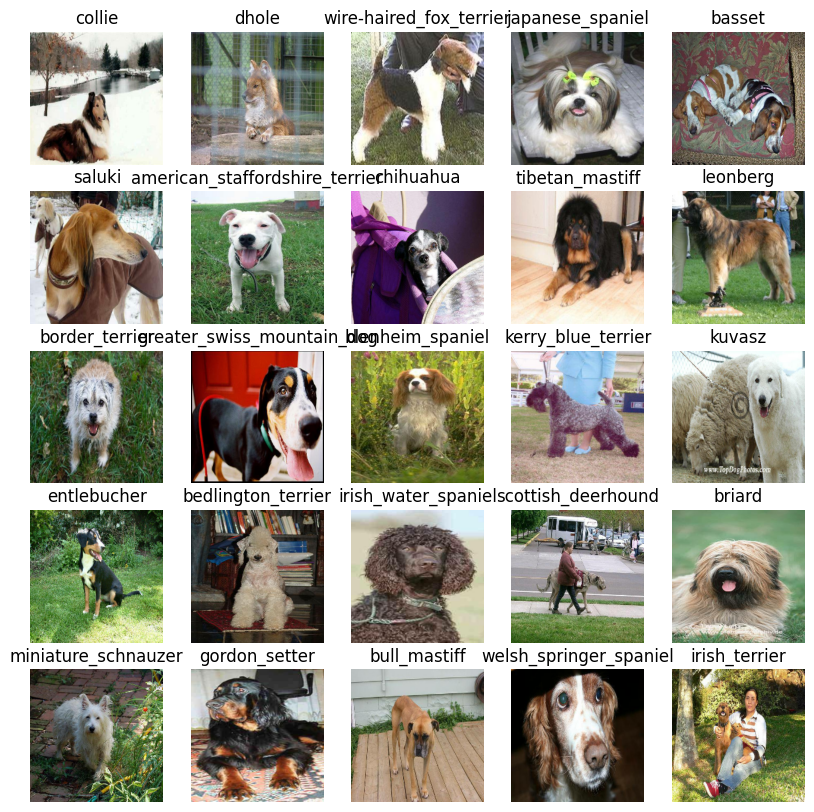

In [46]:
# NOW LET'S VISUALIZE THE DATA IN THE TRAINING BATCH
show_25_images(train_images, train_labels)

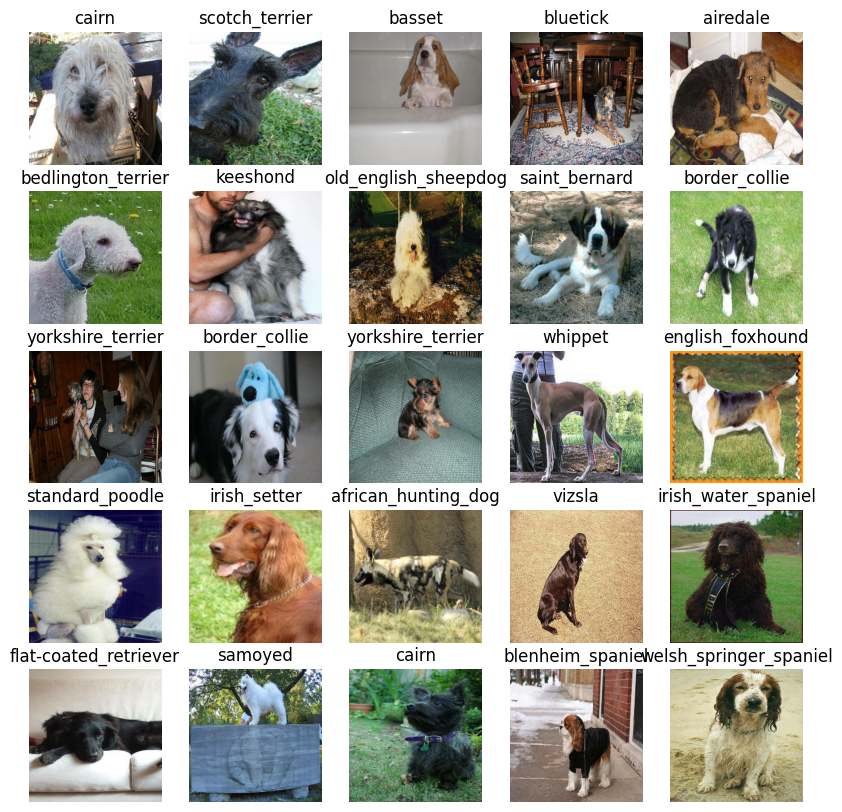

In [47]:
# NOW LET'S VISUALIZE THE DATA FOR THE VALIDATION BATCH
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# **BUILDING A MODEL**

Before we'll build a model, there are few things we need to define :
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) to our model.
* The URL of the model we want to use and apply the algoirthms

In [48]:
# SETUP THE SHAPE OF THE INPUT
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# SETUP THE SHAPE OF THE OUTPUT FOR OUR MODEL
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# SETUP MODEL URL FROM TENSORFLOW HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our important model link, so our inputs, outputs and model ready to go. Let's put them together into a KERAS DEEP LEARNING MODEL!

Knowing this, let's create a function which performs:
* Takes the input shape, output shape, and the model we've chosen as parameters
* Defines the layers in a KERAS model in sequential fashion. (hierarchy) step by step process.
* Compiles the model (say it should be evaluated and improved).
* Builds the model (tells the input shape to the model).
* Returns the model.

CREATE A FUNCTION WHICH BUILDS A KERAS MODEL

### CREATE_MODEL()



In [49]:
# CREATE A FUNCTION WHICH BUILDS A KERAS MODEL
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # SETUP THE MODEL LAYERS
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # COMPILE THE MODEL
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # BUILD THE MODEL
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [50]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# **CREATING THE CALLBACKS**

Callbacks are helper functions a model can use during training to do such things, as to save its progress. Then check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for the TensorBoard which helps track our model progress.

Another model, for early stopping which prevents our model from training too long (OVERFISHING may happens in this case, so stopping it is the precise manner)



#### TensorBoard CallBack

> To setup the TensorBoard Callback, we need to do 3 things:

1.   Load the TensorBoard notebook extension.
2.   Create a TensorBoard Callback which is able to save logs to a directory and pass it to our model's `fit()` funcion.
3.   Visualize our models training logs with the **`%tensorboard`** magic function (we'll do after the model training).



In [51]:
# LOAD THE TENSORFLOW-BOARD EXTENSION TO THE NOTEBOOK
%load_ext tensorboard


In [52]:
import datetime
import os

# CREATE A FUNCTION TO BUILD A TENSORFLOW CALLBACK
def create_tensorboard_callback():

  # CREATE A LOG DIRECTORY FOR STOING THE TENSORBOARD LOGS
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run the experiment
                        datetime.datetime.now().strftime("%Y%m%d - %H%M%S"))

  # TENSORBOARD ENABLES THE VISUALIZATION TOOL PROVIDED WITH THE TENSORFLOW
  return tf.keras.callbacks.TensorBoard(logdir)

So we've got a tensorboard callback which is going to help us monitoring the model's performenace as it's training. So, figuring if it's learning correctly or finding that is it doing well enough or not.



### **EARLY STOPPING CALLBACK**

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [53]:
# LET'S CREATE AN EARLY STOPPING CALLBACK WHICH STOPS THE PREVENTION OF OVERFISHING
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

# **TRAINING A MODEL (ON SUBSET OF DATA)**

Our first model is only going to train 1000 images, to make sure the things are working correctly.


In [54]:
# HOW MANY PASSES OF THE DATA WE'D LIKE OUR MODEL TO DO
# PASS IS YOU CAN IMAGINE IS EQUIVALENT TO OUR MODEL TRYING TO FIND THE PATTERNS IN EACH DOG IMAGEAND SEE WHICH PATTERNS RELATE TO EACH LABEL
NUM_EPOCHS = 100  #@param {type:"slider", min:10, max:100, step:10}

In [55]:
# CHECK TO MAKE SURE THE THINGS WE'LL RUNNING ON THE SAME GPU
if tf.config.list_physical_devices():
  print("GPU is performing on this device")
else:
  print("Not available")

GPU is performing on this device


#### TRAIN_MODEL()

Let's create a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensor_callback()`
* Call the `fit()`function on our model passing it the training data, validation data, numer of epochs, to train for `(NUM_EPOCHS)` and the callbacks we'd like to use.
* Return the model

In [56]:
# BUILD  A FUNCTION TO TRAIN AND RETURN A TRAINED MODEL
def train_model():
  """
  TRAINS A GIVEN MODEL AND RETURNS THE TRAINED VERSION.
  """

  # CREATE A MODEL
  model = create_model()

  # CREATE NEW TENSORBOARD SESSION EVERYTIME WE TRAIN A MODEL
  tensorboard = create_tensorboard_callback()

  # FIT THE MODEL TO THE DATA PASSING IT TO THE CALLBACK WE CREATED
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # RETURN THE FITTED MODEL
  return model

In [57]:
# FIT THE MODEL TO THE DATA
model = train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 164s 6s/step - loss: 4.6237 - accuracy: 0.1075 - val_loss: 3.3848 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 77s 3s/step - loss: 1.6557 - accuracy: 0.6850 - val_loss: 2.1343 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 67s 3s/step - loss: 0.5662 - accuracy: 0.9450 - val_loss: 1.6353 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 68s 3s/step - loss: 0.2505 - accuracy: 0.9862 - val_loss: 1.4496 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 59s 2s/step - loss: 0.1454 - accuracy: 0.9987 - val_loss: 1.3875 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 59s 2s/step - loss: 0.1003 - accuracy: 0.9987 - val_loss: 1.3293 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================] - 69s 3s/

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than validation dataset, So what are the ways to prevent the model overfitting in deep learning neural networks?

----------------------------------------------------------------
**NOTE:** OVERFITTING TO BEGIN WITH IS A GOOD THING! IT MEANS OUR MODEL IS LEARNING

# CHECKING THE TENSORBOARD LOGS

The TensorBoard magic function **`(%tensorboard)`** will access the logs directory we created earlier and visualize its contents.

In [58]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# **MAKING AND EVALUATING PREDICTIONS USING A TRAINED MODEL**

In [59]:
# MAKE PREDICTIONS ON THE VALIDATION DATA (NOT USED TRAINED ON)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 12s 1s/step


array([[1.17091986e-03, 9.37340374e-05, 2.60382891e-03, ...,
        5.28177246e-04, 2.71261397e-05, 3.44932009e-03],
       [5.16326691e-04, 3.47339112e-04, 5.40329656e-03, ...,
        1.07427721e-03, 1.70786562e-03, 1.36711547e-04],
       [4.47984639e-05, 6.00850559e-04, 1.66425540e-04, ...,
        6.76108320e-05, 2.69064447e-04, 1.85153636e-04],
       ...,
       [1.24208520e-06, 3.77257493e-05, 1.41970559e-05, ...,
        3.88965782e-05, 1.19308432e-04, 2.89262734e-05],
       [1.17636435e-02, 2.57620326e-04, 6.43041785e-05, ...,
        8.12701997e-04, 8.82406021e-05, 6.20776787e-03],
       [4.49796826e-05, 2.14659012e-05, 7.43038312e-04, ...,
        7.38201954e-04, 7.52334250e-04, 3.16451682e-04]], dtype=float32)

In [60]:
predictions.shape

(200, 120)

In [61]:
len(Y_val), len(unique_breeds)

(200, 120)

In [62]:
#There are total 200 arrays of 120 different numbers that are very small floating values
len(predictions[0])

120

**IT IS AN ASSOCIATED PROBABILITY FOR THE LIKENESS. SO, BASICALLY WHAT OUR MODEL THINKS A CERTAIN IMAGE IS RELATED TO. THERE'S A PROBABILTY VALUE HERE FOR EVERY SINGLE LABEL (BREED)**

THE IMAGE IN THE VALIDATION DATA, THE HIGHEST VALUE IN HERE IS GOING TO CORRESPOND TO THE INDEXOF THE LABEL THAT THE MODEL THINKS IS MOST LIKELY.

In [63]:
np.sum(predictions[0])

1.0

In [64]:
np.sum(predictions[1])

0.99999994

In [65]:
# FIRST PREDICTION
print(predictions[0])
print(f"Max Value (Probability of prediction): {np.max(predictions[0])}")
print(f"Min value (Probabilty of prediction): {np.min(predictions[0])}")
print(f"Sum value (Probabilty of prediction): {np.sum(predictions[0])}")
print(f"Max Index: {np.argmax(predictions[0])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[0])]}")

[1.17091986e-03 9.37340374e-05 2.60382891e-03 1.07853011e-05
 9.02902684e-05 7.39774550e-05 1.31545449e-02 1.16458209e-03
 2.13938503e-04 4.57209593e-04 1.74422108e-04 1.03789549e-04
 3.13672819e-04 6.25705725e-05 5.35089115e-04 1.81884068e-04
 1.53198107e-05 2.21468180e-01 1.20308168e-05 1.15187235e-04
 2.72083358e-04 1.06640357e-04 3.29460054e-05 4.82094154e-04
 1.48267773e-05 7.42850534e-05 2.39515245e-01 1.19518918e-04
 4.30892280e-04 2.12909930e-04 4.80121926e-05 5.39903354e-04
 4.29755717e-04 5.14927196e-05 1.73336794e-05 9.95669421e-03
 9.02025113e-06 8.60139553e-05 5.31622427e-05 6.62319944e-05
 1.07910717e-03 9.42032057e-06 6.30066788e-05 2.28750476e-04
 8.50636388e-06 2.65399485e-05 3.47271343e-05 2.97427250e-05
 2.18867837e-03 1.68794330e-04 3.27966918e-05 9.30590686e-05
 6.86426181e-04 1.40379707e-04 7.42861812e-05 1.32620471e-05
 7.21348741e-04 1.08506938e-03 1.16321724e-03 9.62555781e-02
 3.87523556e-04 7.33029810e-05 1.73199980e-03 5.30412617e-05
 3.46631947e-04 2.807313

**THE MORE MAX VALUE (PROBABILTY OF PREDICTION) THEN, THE MORE THE CONFIDENCE OF MODEL BEING CORRECTLY GUESSING THE LABELS FROM THE DATASET**

In [66]:
unique_breeds[20]

'bouvier_des_flandres'

# **GETTING THE PREDICTION LABEL IMAGES**

#### GET_PRED_LABEL()

HAVING THE ABOVE FUNCTIONALITY IS GREAT BUT WE HAVE TO BE ABLE TO DO IT AT SCALE

AND IT WOULD BE EVEN BETTER IF WE COULD SEE THE IMAGE THE PREDICTION IS BEING MADE ON!

**NOTE:** PREDICTION PROBABILTIES ARE ALSO KNOWN AS CONFIDENCE LEVELS

In [67]:
# TURN THE PREDICTION PROBABILTIES INTO THEIR RESPECTIVE LABEL  (EASIER TO UNDERSTAND)
def get_pred_label(prediction_probabilties):
  """
  TURNS AN ARRAY OF PREDICTION PROBABILTIES INTO A LABEL.
  """
  return unique_breeds[np.argmax(prediction_probabilties)]

In [68]:
# GET A PREDICTED LABEL BASED ON THE ABOVE FUNCTION THAT IS BASED ON AN ARRAY  OF PREDICTION PROBABILITIES
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

--------------------------------------------------

# **UNBATCHING VALIDATION DATASET**

In [69]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch format dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions into the validation labels

In [70]:
images_unbatch = []
labels_unbatch = []

# LOOP THROUGH THE UNBATCH DATA
for image, label in val_data.unbatch().as_numpy_iterator():
  images_unbatch.append(image)
  labels_unbatch.append(label)

images_unbatch[0], labels_unbatch[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [71]:
# CREATE A FUNCTION TO UNBATCH A BATCH DATASET
def unbatchify(data):
  """
  TAKES A BATCHED DATASET OF (IMAGE, LABEL) TENSORS AND REUTRNS SEPARATE ARRAYS OF IMAGES AND LABELS.
  """
  images = []
  labels = []

  # LOOP THROUGH UNBATCHED DATA
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# UNBATCHIFY THE VALIDATION DATA
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [72]:
get_pred_label(val_labels[0])

'affenpinscher'

In [73]:
get_pred_label(predictions[0])

'cairn'

# **VISUALIZING**

Now we've got ways to get the following outputs:
* Prediction labels
* Validation labels
* Validation images

Let's make some functions to make it a bit more visualize.

We'll create a function which takes an array of prediction probabilities, an array of truth labels, and an array of images and an integer.

* Conver the prediction probabilties to a predicted label.
* Plot the predicted label, its' predicted probability, the truth label and the target image on the a single plot.

#### PLOT_PRED()

In [74]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  VIEW THE PREDICTION, GROUND TRUTH AND IMAGE FOR SAMPLE n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # GET THE PRED LABEL
  pred_label = get_pred_label(pred_prob)

  # PLOT IMAGE & REMOVE THE TICKS
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # CHANGE THE COLOR OF THE TITLE DEPENDING ON IF THE PREDICTION IS RIGHT OR WRONG
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # CHANGE THE PLOT TITLE TO BE PREDICTED, PROBABILITY OF PREDICTION AND TRUTH LABEL
  plt.title(f"{pred_label} {np.max(pred_prob)*100:2.0f}% {true_label}", color = color)

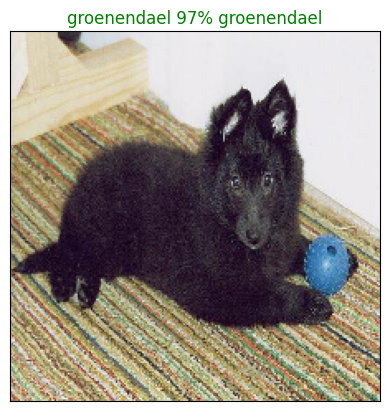

In [75]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

#### PLOT_PRED_CONF()

Now we've got one function to visualize our models top prediction, let's make another to view our model top 10 predictions.

The function will:
* Take an input of predictions probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Predication labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [76]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  PLUS THE TOP 10 HIGHEST PREDICTION CONFIDENCES ALONG WITH THE TRUTH LABEL FOR SAMPLE n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # GET THE PREDICTED LABEL
  pred_label = get_pred_label(pred_prob)

  # FIND THE TOP 10 CONFIDENCE INDEXES
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # FIND THE TOP 10 PREDICTION CONFIDENCE VALUES
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # FIND THE TOP 10 PREDICTION LABELS
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # SETUP THE PLOT
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # CHANGE THE COLOR OF TRUE LABEL
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

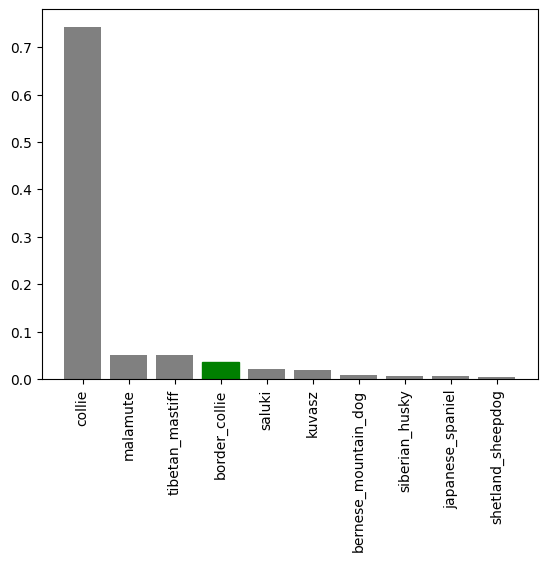

In [77]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [78]:
predictions[0].argsort()

array([ 44,  36,  75,  41,   3,  18,  55,  24,  16,  34,  69,  45, 118,
       115,  47,  84,  50,  22,  46,  71, 113, 108, 112,  30,  33,  63,
        38,  92,  13,  42,  39,  94,  61,   5,  25,  54,  99,  37,   4,
        51,   1, 105,  86,  11,  21,  66, 101,  19,  27, 107,  53,  88,
        49,  89,  80,  10,  87,  95,  15,  91,  78,  29,  98,   8,  82,
        43,  67,  72,  20,  12,  64, 104, 110,  60, 111,  32,  28,   9,
        23, 117,  14,  31,  81,  52,  56,  93,  90, 114,  74,  40,  57,
        58,   7,   0,  85, 109,  62,  96,  68,  48,   2,  76,  65, 119,
        35, 116,   6, 100,  97,  73,  77, 106,  83,  79, 102,  70,  59,
       103,  17,  26])

In [79]:
p = predictions[0].argsort()[-10:][::-1]
p

array([ 26,  17, 103,  59,  70, 102,  79,  83, 106,  77])

In [80]:
predictions[0][p]

array([0.23951524, 0.22146818, 0.12141886, 0.09625558, 0.03408945,
       0.03295764, 0.03186668, 0.02911234, 0.02703984, 0.02592913],
      dtype=float32)

In [81]:
predictions[0].max()

0.23951524

In [82]:
unique_breeds[p]

array(['cairn', 'border_terrier', 'soft-coated_wheaten_terrier',
       'irish_wolfhound', 'lhasa', 'silky_terrier', 'norfolk_terrier',
       'otterhound', 'standard_schnauzer', 'miniature_schnauzer'],
      dtype=object)

-------------------------------

Now we've got some functions to visualize our predictions and evaluate our model, let's check out a few.

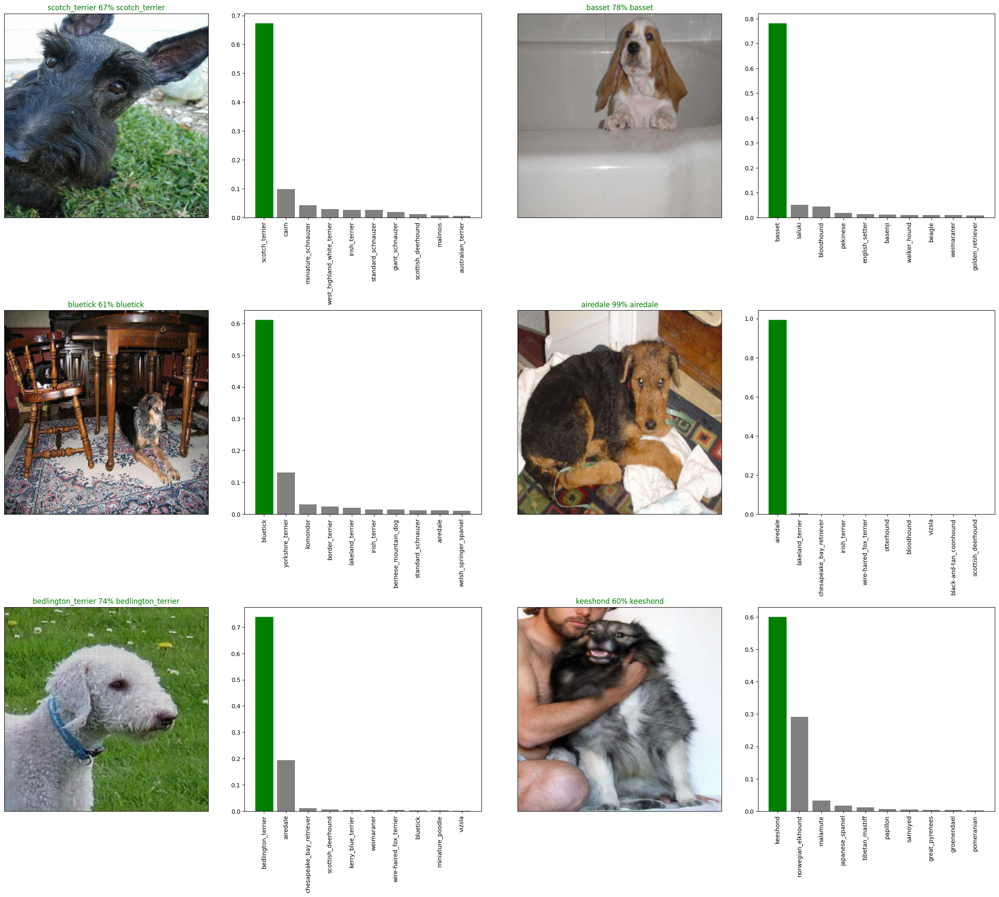

In [83]:
# LET'S CHECK OUT THE FEW PREDICTIONS AND THEIR DIFFERENT VALUES
i_multiplier = 1
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (12*num_cols, 7*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()


----------------------------------------------------------------

# **SAVING AND RELOADING THE TRAINED MODEL**

#### SAVE_MODEL()

In [84]:
### CREATE A FUNCTION TO SAVE A MODEL
def save_model(model, suffix = None):
  """
  SAVES A GIVEN MODELIN A MODELS DIRECTORY AND APPENDS A SUFFIX (STRING)
  """

  # CREATE A MODEL DIRECTORY PATH-NAME WITH CURRENT TIME
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"      # save format of the model

  print(f"Saving model to : {model_path}")
  model.save(model_path)
  return model_path

#### LOAD_MODEL()

In [85]:
### CREATE A FUNCTION TO LOAD A TRAINED MODEL
def load_model(model_path):
  """
  LOADS A SAVED MODEL FROM A SPECIFIED PATH.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load the trained model. So, let's make sure they work it properly.

In [86]:
# SAVE OUR MODEL ON 1000 IMAGES
save_model(model, suffix= "1000-images-mobilenetv2-Adam")

Saving model to : /content/drive/MyDrive/Dog Vision/models/20240508-09251715160357-1000-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog Vision/models/20240508-09251715160357-1000-images-mobilenetv2-Adam.h5'

In [87]:
# LOAD A TRAINED MODEL
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20240506-15451715010348-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240506-15451715010348-1000-images-mobilenetv2-Adam.h5


In [88]:
# EVALUATE THE PRE-SAVED MODEL
model.evaluate(val_data)

7/7 [==============================] - 12s 1s/step - loss: 1.1888 - accuracy: 0.6750


[1.1888033151626587, 0.675000011920929]

In [89]:
# EVALUATED THE LOADED MODEL
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 1.2165 - accuracy: 0.6800


[1.216505765914917, 0.6800000071525574]

# **`KAGGLE DATASET`**

In [90]:
len(X), len(Y)

(10222, 10222)

**CREATE A DATABATCH WITH THE FULL DATA SET**

In [91]:
full_data = create_data_batches(X, Y)

Creating training data batches...


In [92]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

**CREATE A MODEL FOR FULL MODEL**

In [93]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


**CREATE FULL MODEL CALLBACKS**

In [94]:
full_model_tensorboard = create_tensorboard_callback()

# NO VALIDATION SET IS PRESENT WHILE TRAINING ON ALL THE DATA, SO WE CAN'T MONITOR THE VALIDATION ACCURACY

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**FIT THE FULL MODEL TO THE FULL DATA**

> **NOTE:** RUNNING THE CELL BELOW WILL TAKE A LITTLE WHILE (MAYBE UPTO 30 MINUTES FOR THE FIRST EPOCH) BECAUSE THE GPU WE'RE RUNNING IN THE RUNTIME HAS TO LOAD ALL THE IMAGES INTO THE MEMORY.

In [95]:
# full_model.fit(x=full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard, full_model_early_stopping])

In [96]:
# save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [97]:
# LOADING THE MODEL FOR THE FULL DATASET TEST
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20240507-11071715080041-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240507-11071715080041-full-image-set-mobilenetv2-Adam.h5


### MAKING PREDICTIONS ON THE TEST DATASET

Since our model has been trained on images in the form of Tensor batches, to make the predictions on the test data, we'll have to get it into the same format.

Using `create_data_batches()` which can take a list of filenames as input and convert them into the Tensor Batches

To make predictions on the test data, we'll:
* Get the test image filenames
* Conver the filenames into the test data batches using the `create_data_batches()` and setting the `test_data` parameter to `True`. (Since, the test data doesnt' have the labels)
* Make a predictions arrays by passing the test batches to the `predict()` method called on our model.

In [98]:
# LOAD TEST IMAGE FILE NAMES
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4b8eb057df510fa776516de19c9fa92.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e137b0cd96051765c349377725c4696d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e0295b9b1bee725d52d74f9af84092cf.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df0d6ba158287cb2b3ed6459a22d42ba.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e1cad2c1658b4a81db4750218a1f57d2.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6223aba45a94c9ac349967ed946d0f7.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e0a21cb0d8d3014b6c56230350a9362f.jpg']

In [99]:
len(test_filenames)

10386

In [100]:
# CREATE THE TEST DATA BATCH
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [101]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

### MAKING THE PREDICTIONS ON THE TEST DATA BATCH USING THE FULL_LOADED_MODEL

**NOTE:** Calling `predict()` on our full model and passing it the test data batches, will take a long time to run

In [102]:
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

325/325 [==============================] - 963s 3s/step


In [105]:
# SAVE THE PREDICTIONS (NUMPY ARRAY) TO THE .CSV FILE (FOR ACCESS LATER)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter = ",")

In [106]:
# LOAD PREDICTION (NUMPY ARRAY) FROM THE CSV FILE
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ",")

In [107]:
test_predictions[10]

array([9.96266246e-01, 6.71426733e-07, 3.72075837e-09, 1.03376856e-10,
       1.72351868e-12, 1.66503616e-12, 3.69883892e-08, 1.65828618e-11,
       2.98559177e-10, 3.42267854e-13, 3.00357361e-09, 5.27587021e-04,
       3.33388187e-15, 5.11091287e-07, 3.70812566e-13, 2.48600897e-11,
       4.45179558e-06, 2.25354086e-07, 1.17183555e-10, 2.74198081e-10,
       7.75507069e-04, 9.80093715e-11, 3.46067281e-06, 6.27765439e-06,
       3.32503448e-12, 7.81176510e-08, 6.71729026e-07, 4.18303725e-11,
       1.88158950e-13, 1.20643193e-08, 7.53534763e-08, 2.83027529e-12,
       3.43793567e-06, 2.60311802e-12, 6.42186374e-11, 1.28031461e-08,
       5.05594881e-14, 1.23232132e-12, 4.85460366e-14, 9.02544607e-15,
       2.65930222e-10, 1.66846176e-10, 1.39614394e-13, 1.24052210e-14,
       5.60444278e-08, 7.55139354e-07, 5.05759878e-10, 1.34416402e-11,
       2.16174940e-05, 3.84650818e-11, 7.46811946e-10, 2.83095531e-12,
       3.63700037e-13, 6.32104036e-10, 1.05939316e-05, 1.05571010e-12,
      

In [108]:
test_predictions.shape

(10386, 120)

# **PREPARING TEST DATASET FOR KAGGLE SUBMISSION**

The model prediction file outputs needs to be in a DataFrame with an ID, and a column for each different breeds.

To get the data in DataFrmae :
* Create a pandas dataframe with ID column as well as columns for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilties) to each of the dog breed columns
* Export the DataFrame as a CSV to sumbit it.

In [109]:
# CREATE A PANDAS DATAFRAME WITH EMPTY COLUMNS OF ID AND DIFFERENT BREEDS OF DOG
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [110]:
# HOW TO DO APPENDING OF ID'S INTO THE DATAFRAME IN JPG FORMAT
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/Dog Vision/test/e78b4a09e5f86c330e24c6aaed63f0be',
 '.jpg')

In [111]:
# APPEND TEST IMAGE ID's TO PREDICTION DATAFRAME
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [112]:
preds_df["id"] = test_ids

In [113]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e78b4a09e5f86c330e24c6aaed63f0be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3baf6b2914677edd2729db0f32e2620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e4b8eb057df510fa776516de19c9fa92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e137b0cd96051765c349377725c4696d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0295b9b1bee725d52d74f9af84092cf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
# ADD THE PREDICTION PROBABILTIES TO EACH DOG BREEDS COLUMN
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e78b4a09e5f86c330e24c6aaed63f0be,7.613995e-05,2.312216e-08,5.616280e-07,5.675171e-07,6.126305e-03,3.993584e-05,4.851243e-10,3.309432e-04,4.537384e-07,...,3.127022e-07,3.919632e-09,1.958557e-08,3.142850e-05,1.125899e-07,3.155812e-07,1.125370e-05,5.753715e-04,6.507258e-08,2.595607e-08
1,e3baf6b2914677edd2729db0f32e2620,6.649328e-07,6.075110e-07,9.228525e-09,1.334725e-06,1.614738e-07,4.904853e-09,2.325694e-09,5.103731e-10,1.388261e-10,...,1.767283e-04,3.316408e-10,2.931051e-07,1.214594e-07,1.704962e-08,5.322389e-13,7.880586e-11,3.546755e-09,1.881556e-09,5.130855e-10
2,e4b8eb057df510fa776516de19c9fa92,3.453130e-09,8.567016e-12,4.275225e-14,1.066054e-11,3.478963e-11,1.726292e-12,3.141467e-13,2.688549e-11,2.473199e-13,...,2.319814e-08,1.434289e-12,4.623494e-10,8.188062e-12,1.695204e-11,8.270386e-12,4.106056e-12,2.400582e-14,7.377810e-12,2.262644e-10
3,e137b0cd96051765c349377725c4696d,3.712655e-09,1.092639e-07,5.600574e-08,1.062774e-07,1.512751e-07,3.294171e-09,1.273531e-07,2.801719e-07,5.291731e-10,...,4.593035e-08,9.749771e-08,5.468364e-08,1.594577e-09,1.456795e-09,6.185578e-09,2.578347e-08,2.188823e-09,3.411635e-05,4.459739e-07
4,e0295b9b1bee725d52d74f9af84092cf,1.236238e-08,2.546748e-07,1.829067e-08,2.817004e-07,1.869076e-09,5.982162e-09,4.509298e-07,2.894706e-12,1.327607e-10,...,2.377515e-10,1.049387e-08,6.892089e-12,1.929249e-06,2.713385e-06,4.354630e-11,3.482285e-08,2.299967e-06,1.299967e-05,2.211420e-08


In [115]:
# SAVING FILE TO CSV OF PREDICTION OF DATAFRAME FOR ATTEMPTING ON KAGGLE
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_1_mobilenetV2.csv", index = False)

----------------------------------

# **MAKING PREDICTIONS ON THE CUSTOM IMAGES**

To make the predicitons on the custom images:
* Get the file paths of our own images
* Uploading those images into the drive (as we connected through the google drive)
* Turn the file paths into the databatches using `create_data_batches()`. And since our custom images wont' have labels, we set `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilties to predictions labels.
* Compare the predicted labels to the custom images.

In [116]:
# GET THE CUSTOM IMAGES FILE PATHS
custom_path = "/content/drive/MyDrive/Dog Vision/Custom Dog/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [117]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/Custom Dog/dachshund-1519374_1280.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom Dog/dog-7956828_1280.jpg']

In [118]:
# TURN THE CUSTOM IMAGES INTO THE BATCH DATASETS
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [119]:
# MAKE PREDICTIONS ON THE CUSTOM DATA TO PREDICT THE LABELS(BREED OF THE DOG)
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 0s 467ms/step


(2, 120)

In [120]:
# GET THE CUSTOM IMAGE PREDICATION LABELS
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['black-and-tan_coonhound', 'greater_swiss_mountain_dog']

In [121]:
# GET THE IMAGES (UNBATCHIFY() function won't work)
custom_images = []

# LOOP THROUGH UNBATCHED DATA
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

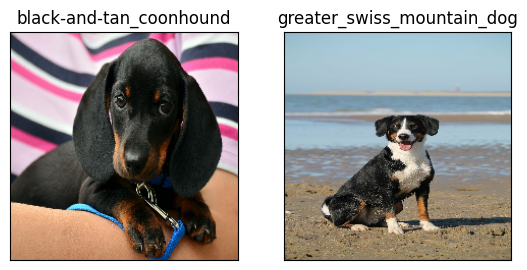

In [122]:
# CHECK CUSTOM IMAGE PREDICTIONS
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)